# Trabajo Práctico Final - Grupo 2
## Matías Bergerman, Pablo González Leiro, Tobias Demeco, Matías Tripoli

In [1]:
# Import Libraries

import os
import numpy as np
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
import cv2
from PIL import Image

import pandas as pd
import xml.etree.ElementTree as ET 

path_used = "./PCB_DATASET/PCB_USED/"
path_db = "./PCB_DATASET/images/"
path_annotations = "./PCB_DATASET/Annotations/"

In [2]:
import sys
nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)

## Algoritmos de detección de errores

#### In-line Display

In [3]:
def display_np(x, scale = 1.0, resampling = Image.Resampling.BICUBIC):
    im = Image.fromarray(x.clip(0, 255).astype(np.uint8))
    display(im.resize((np.array(im.size)*scale).astype(int), resampling))
    
def display_np_row(x, scale = 1.0, resampling = Image.Resampling.BICUBIC, spacer_width = 0, spacer_grayscale = 0):
    img = np.array(x, dtype=np.uint8)
    if len(img.shape) <= 3:
        spacer = np.ones((img[0].shape[0], spacer_width), dtype=np.uint8) * spacer_grayscale
    else:
        spacer = np.ones((img[0].shape[0], spacer_width, img[0].shape[2]), dtype=np.uint8) * spacer_grayscale
        
    img_combined = img[0]
    for i in range(1, len(img)):
        img_combined = np.concatenate((img_combined, spacer, img[i]), axis=1)
    display_np(img_combined, scale, resampling)


#### Histogram

`img_histogram`

`equalize_image_histogram`

#### Constrast

`adjust_contrast`

`stretch_image_contrast`

#### K-Means Clustering

`kmeans_cluster`

`kmeans_disable_clusters`

##### K-means clustering algorithm test

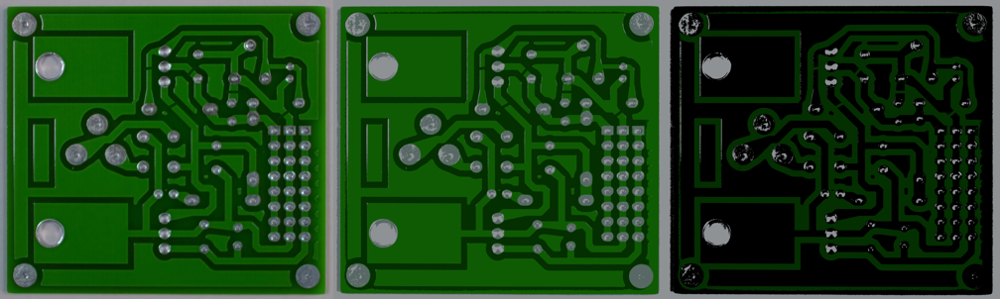

In [4]:
from pcb_dip.pcb_dip_tools import kmeans_cluster, kmeans_disable_clusters

img_pcb = cv2.imread(f'{path_db}Open_circuit/10_open_circuit_03.jpg')

k = 4
pcb_cluster, labels = kmeans_cluster(img_pcb, k)
pcb_cluster_2 = kmeans_disable_clusters(pcb_cluster, labels, k, [0, 1])

display_np_row([img_pcb, pcb_cluster, pcb_cluster_2], 0.15 )

### Image segmentation and filtering

`get_pcb_silk_and_pads`

`gray_smooth_pcb`

### Open-circuit detection

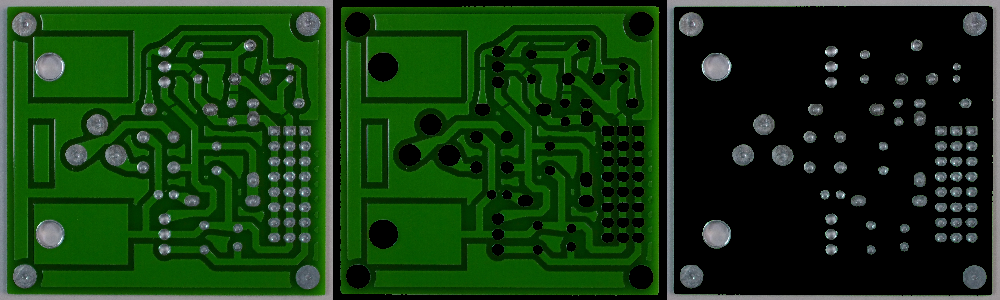

In [5]:
from pcb_dip.pcb_dip_tools import get_pcb_silk_and_pads, gray_smooth_pcb, img_histogram

# Open Test Image
img_pcb = cv2.imread(f'{path_db}Open_circuit/10_open_circuit_03.jpg')

pcb_silk, pcb_pads = get_pcb_silk_and_pads(img_pcb, glitch_radius=20)
display_np_row([img_pcb, pcb_silk, pcb_pads])

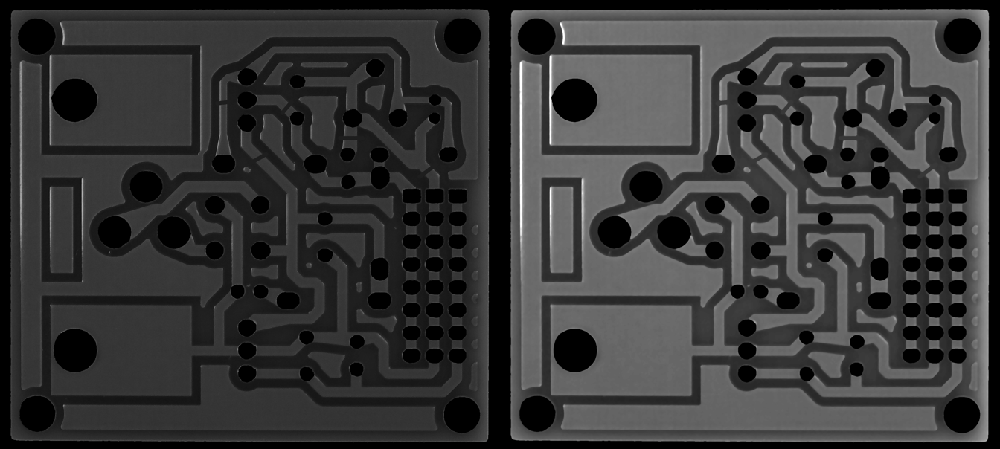

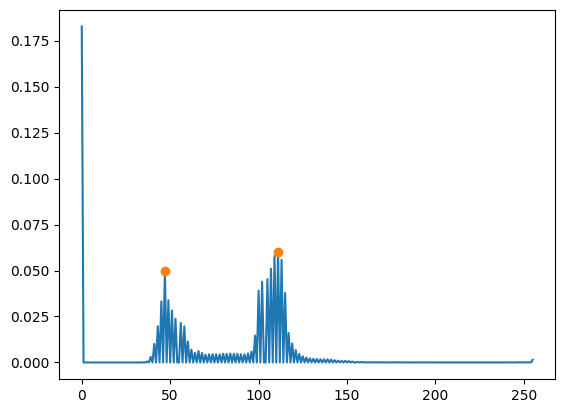

In [6]:
pcb_silk_smooth = gray_smooth_pcb(pcb_silk) 

display_np_row([cv2.cvtColor(pcb_silk, cv2.COLOR_BGR2GRAY), pcb_silk_smooth], 0.3)

hist = img_histogram(pcb_silk_smooth)

plt.plot(hist)
peaks,_ = find_peaks(hist, distance = 25, prominence = 0.01)
plt.plot(peaks, [hist[i] for i in peaks], 'o')
plt.show()

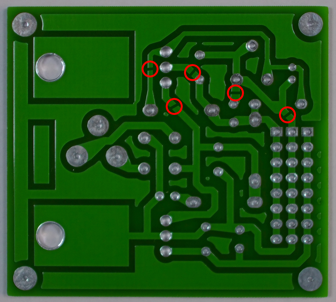

In [7]:
from pcb_dip.open_circuit import get_open_circuit_keypoints_from_smooth

def drawKeyPts(img, keypoints, color, thickness, fixed_size=0):
    for point in keypoints:
        x = int(point.pt[0])
        y = int(point.pt[1])
        size = int(point.size) if fixed_size == 0 else fixed_size
        cv2.circle(img, (x,y), size, color, thickness=thickness, lineType=8, shift=0) 
    return img    


keypoints = get_open_circuit_keypoints_from_smooth(pcb_silk_smooth)

im_with_keypoints = drawKeyPts(img_pcb.copy(), keypoints, (255,0,0), 12, fixed_size=50)
display_np(im_with_keypoints, 0.15)

### Missing hole detection

`get_missing_hole_keypoints`

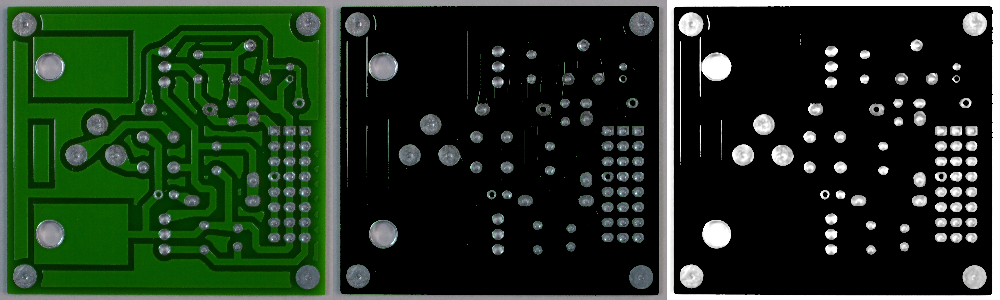

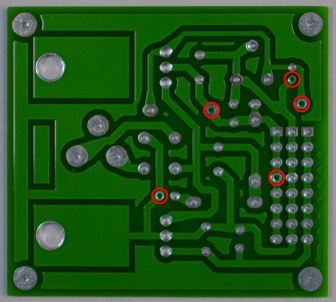

In [8]:
from pcb_dip.pcb_dip_tools import get_pcb_silk_and_pads, gray_smooth_pcb
from pcb_dip.missing_hole import get_missing_hole_keypoints_from_smooth


# Open Test Image
img_pcb = cv2.imread(path_db+'Missing_hole/10_missing_hole_01.jpg')

pcb_silk, pcb_pads = get_pcb_silk_and_pads(img_pcb, glitch_radius=1)

pcb_pads_smooth = gray_smooth_pcb(pcb_pads)

display_np_row([img_pcb, pcb_pads, cv2.cvtColor(pcb_pads_smooth, cv2.COLOR_GRAY2BGR)])

keypoints = get_missing_hole_keypoints_from_smooth(pcb_pads_smooth)

im_with_keypoints = drawKeyPts(img_pcb.copy(), keypoints, (255,0,0), 12, fixed_size=50)
display_np(im_with_keypoints, 0.15)

### Mouse-bite detection

#### Hough transform algorithm test

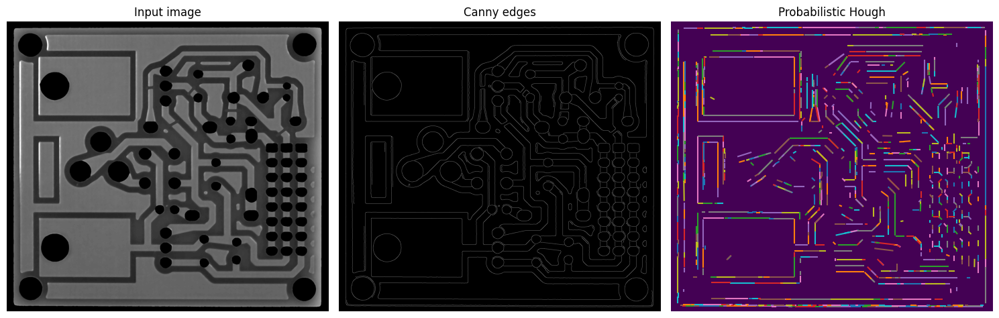

In [9]:
from skimage.transform import probabilistic_hough_line
from skimage.feature import canny
from matplotlib import cm


# Line finding using the Probabilistic Hough Transform
image = pcb_silk_smooth
edges = canny(image, 2, 1, 25)
lines = probabilistic_hough_line(edges, threshold=100, line_length=10,
                                 line_gap=5)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(edges * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

## Abrir las anotaciones

In [10]:
path_an = "./PCB_DATASET/Annotations"
print(path_an)

./PCB_DATASET/Annotations


In [11]:
dataset = {
            "xmin":[],
            "ymin":[],   
            "xmax":[],
            "ymax":[],
            "class":[],    
            "file":[],
            "width":[],
            "height":[],
           }
all_files = []
for path, subdirs, files in os.walk(path_an):
#     print([path, subdirs, files])
    for name in files:
        all_files.append(os.path.join(path, name))

# print(all_files)       
print(type(dataset))
print(dataset)

<class 'dict'>
{'xmin': [], 'ymin': [], 'xmax': [], 'ymax': [], 'class': [], 'file': [], 'width': [], 'height': []}


In [12]:
for annotation in all_files:
    # print(anno)
    tree = ET.parse(annotation)
    
    for elem in tree.iter():
        # print(elem)
        
        if 'size' in elem.tag:
            # print('[size] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):
                if 'width' in attr.tag: 
                    width = int(round(float(attr.text)))
                if 'height' in attr.tag:
                    height = int(round(float(attr.text)))    

        if 'object' in elem.tag:
            # print('[object] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):
                
                # print('attr = %s\n' % attr)
                if 'name' in attr.tag:
                    name = attr.text                 
                    dataset['class']+=[name]
                    dataset['width']+=[width]
                    dataset['height']+=[height] 
                    dataset['file']+=[annotation.split('/')[-1][0:-4]] 
                            
                if 'bndbox' in attr.tag:
                    for dim in list(attr):
                        if 'xmin' in dim.tag:
                            xmin = int(round(float(dim.text)))
                            dataset['xmin']+=[xmin]
                        if 'ymin' in dim.tag:
                            ymin = int(round(float(dim.text)))
                            dataset['ymin']+=[ymin]                                
                        if 'xmax' in dim.tag:
                            xmax = int(round(float(dim.text)))
                            dataset['xmax']+=[xmax]                                
                        if 'ymax' in dim.tag:
                            ymax = int(round(float(dim.text)))
                            dataset['ymax']+=[ymax]         

In [13]:
data=pd.DataFrame(dataset)
display(data[data['class']=='missing_hole'][0:3])
display(data[data['class']=='mouse_bite'][0:3])

,xmin,ymin,xmax,ymax,class,file,width,height
0,2459,1274,2530,1329,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586
1,1613,334,1679,396,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586
2,1726,794,1797,854,missing_hole,Annotations\Missing_hole\01_missing_hole_01,3034,1586


,xmin,ymin,xmax,ymax,class,file,width,height
497,1518,913,1547,958,mouse_bite,Annotations\Mouse_bite\01_mouse_bite_01,3034,1586
498,2020,1260,2046,1302,mouse_bite,Annotations\Mouse_bite\01_mouse_bite_01,3034,1586
499,2595,888,2620,920,mouse_bite,Annotations\Mouse_bite\01_mouse_bite_01,3034,1586


In [14]:
data[data['class']=='missing_hole'][0:1].file[0]

'Annotations\\Missing_hole\\01_missing_hole_01'

In [21]:
import re
import os
import pandas as pd
from pcb_dip.missing_hole import get_missing_hole_keypoints
from pcb_dip.open_circuit import get_open_circuit_keypoints
from pcb_dip.score import Score

# Get pcb image numbers
pcb_numbers = [filename[:-4] for filename in os.listdir(path_used)]

# Get classes of errors
classes = os.listdir(path_annotations)

df_score = pd.DataFrame(columns=["file", "tp", "fp", "fn"])

dip_func = {
    'Missing_hole': get_missing_hole_keypoints,
    'Open_circuit': get_open_circuit_keypoints
}

# Iterate for all classes of error and all images for each class
for class_ in ["Open_circuit", "Missing_hole"]:
    df_subset = data[data['class']==class_.lower()]
    for n in pcb_numbers:
        for i in range(1, 21):
            path = f"Annotations\\{class_}\\{n}_{class_.lower()}_{i:02d}"
            defects = df_subset[df_subset.file.str.startswith(path)]
            filepath = defects.iloc[0]
            img_pcb = cv2.imread(f'{path_db}{class_}\\{n}_{class_.lower()}_{i:02d}.jpg')

            keypoints = dip_func[class_](img_pcb)

            score = Score(defects)
            score.checkKeyPoints(keypoints)
            df_score.loc[len(df_score.index)] = [
                path,
                len(score.true_positive),
                len(score.false_positive),
                len(score.false_negative)
                ]
            break

In [ ]:
display(df_score)

,file,tp,fp,fn
0,Annotations\Open_circuit\01_open_circuit_01,2,249,1
1,Annotations\Open_circuit\04_open_circuit_01,6,481,0
2,Annotations\Open_circuit\05_open_circuit_01,8,608,1
3,Annotations\Open_circuit\06_open_circuit_01,14,829,0
4,Annotations\Open_circuit\07_open_circuit_01,19,898,0
5,Annotations\Open_circuit\08_open_circuit_01,24,1162,0
6,Annotations\Open_circuit\09_open_circuit_01,29,1337,0
7,Annotations\Open_circuit\10_open_circuit_01,34,1337,0
8,Annotations\Open_circuit\11_open_circuit_01,39,1454,0
9,Annotations\Open_circuit\12_open_circuit_01,43,1632,1


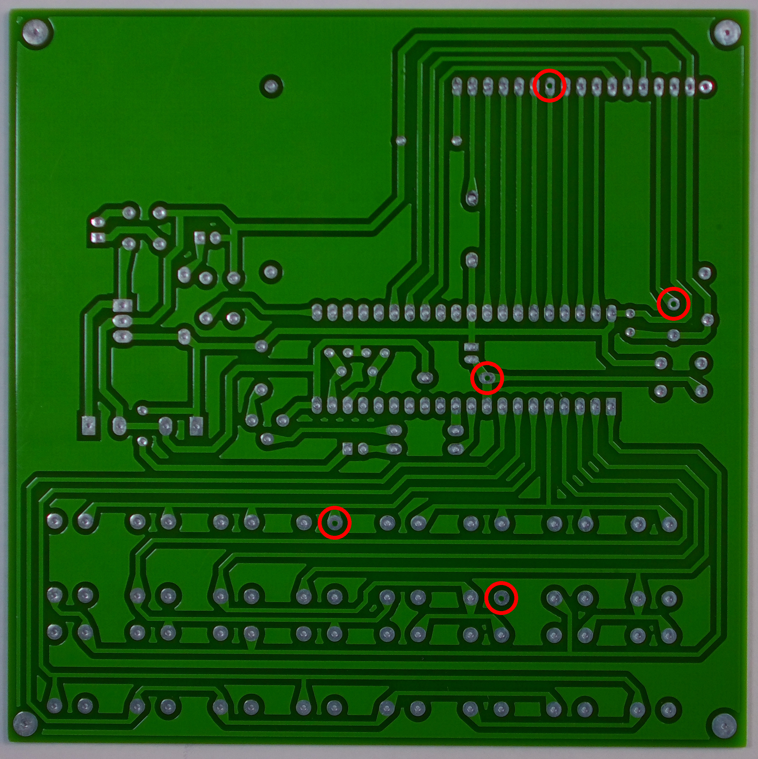

In [ ]:
im_with_keypoints = drawKeyPts(img_pcb.copy(), keypoints, (255,0,0), 12, fixed_size=50)
display_np(im_with_keypoints, 0.3)